In [1]:
#importing packages
import warnings
warnings.filterwarnings("ignore")

import pickle
import os
import pandas as pd
import random as rn
import numpy as np
import tensorflow as tf
# tf.enable_eager_execution()

from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.regularizers import l1,l2
from tqdm import tqdm
import heapq
from sklearn.utils import shuffle
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import ast

from sklearn.model_selection import train_test_split

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
currentDirectory = "../"
dataDirectory = currentDirectory
imageDirectory = dataDirectory + "image_data/train2014/"
val_imageDirectory = dataDirectory + "image_data/val2014/"
test_imageDirectory = dataDirectory + "image_data/test2015/" 
img_width = 224
img_height = 224

BATCH_SIZE = 64
BUFFER_SIZE = 300

In [3]:
data = pd.read_csv(dataDirectory + 'image_text_data/train_image_text_data.csv')
val_data = pd.read_csv(dataDirectory + 'image_text_data/val_image_text_data.csv')
test_data = pd.read_csv(dataDirectory + 'image_text_data/test_image_text_data.csv')

In [4]:
data.dropna(inplace = True)
val_data.dropna(inplace = True)
test_data.dropna(inplace = True)

In [5]:
contractions = { 
"ain't": "am not","aren't": "are not","can't": "cannot","can't've": "cannot have","'cause": "because","could've": "could have","couldn't": "could not",
"couldn't've": "could not have","didn't": "did not","doesn't": "does not","don't": "do not","hadn't": "had not","hadn't've": "had not have",
"hasn't": "has not","haven't": "have not","he'd": "he would","he'd've": "he would have","he'll": "he will","he's": "he is","how'd": "how did",
"how'll": "how will","how's": "how is","i'd": "i would","i'll": "i will","i'm": "i am","i've": "i have","isn't": "is not","it'd": "it would",
"it'll": "it will","it's": "it is","let's": "let us","ma'am": "madam","mayn't": "may not","might've": "might have","mightn't": "might not",
"must've": "must have","mustn't": "must not","needn't": "need not","oughtn't": "ought not","shan't": "shall not","sha'n't": "shall not","she'd": "she would",
"she'll": "she will","she's": "she is","should've": "should have","shouldn't": "should not","that'd": "that would","that's": "that is","there'd": "there had",
"there's": "there is","they'd": "they would","they'll": "they will","they're": "they are","they've": "they have","wasn't": "was not","we'd": "we would",
"we'll": "we will","we're": "we are","we've": "we have","weren't": "were not","what'll": "what will","what're": "what are","what's": "what is",
"what've": "what have","where'd": "where did","where's": "where is","who'll": "who will","who's": "who is","won't": "will not","wouldn't": "would not",
"you'd": "you would","you'll": "you will","you're": "you are"
}

def preprocess_text(text):
    '''Given a text this function removes the punctuations and returns the remaining text string'''
    new_text = ""
    text = text.lower()
    i = 0
    for word in text.split():
        if i==0:
            new_text = contractions.get(word,word)
        else:
            new_text = new_text + " " + contractions.get(word,word)
        i += 1
    return new_text.replace("'s", '')

In [6]:
data['multiple_choice_answer'] = data['multiple_choice_answer'].apply(lambda x: preprocess_text(x))
val_data['multiple_choice_answer'] = val_data['multiple_choice_answer'].apply(lambda x: preprocess_text(x))

In [7]:
X_train = data
X_val = val_data
X_test = test_data

del data, val_data, test_data
len(X_train), len(X_val), len(X_test)

(443757, 214353, 447793)

In [8]:
all_classes = X_train['multiple_choice_answer'].values
class_frequency = {}

for _cls in all_classes:
    if(class_frequency.get(_cls,-1)>0):
        class_frequency[_cls] += 1
    else:
        class_frequency[_cls] = 1

In [9]:
common_tags = heapq.nlargest(1000, class_frequency, key = class_frequency.get)

In [10]:
# take the top 1000 classes
X_train['multiple_choice_answer'] =  X_train['multiple_choice_answer'].apply(lambda x: x if x in common_tags else '')

# removing question which has empty tags
X_train = X_train[X_train['multiple_choice_answer'].apply(lambda x: len(x)>0)]

In [11]:
label_encoder = LabelBinarizer()
answer_vector_train = label_encoder.fit_transform(X_train['multiple_choice_answer'].apply(lambda x: x).values)
answer_vector_val = label_encoder.transform(X_val['multiple_choice_answer'].apply(lambda x: x).values)

ans_vocab = {l: i for i, l in enumerate(label_encoder.classes_)}

print("Number of clasess: ", len(ans_vocab))
print("Shape of Answer Vectors in Train Data: ", answer_vector_train.shape)
print("Shape of Answer Vectors in Validation Data: ", answer_vector_val.shape)

Number of clasess:  1000
Shape of Answer Vectors in Train Data:  (388252, 1000)
Shape of Answer Vectors in Validation Data:  (214353, 1000)


### Question vectors

In [12]:
def preprocess_question(text):
    '''Given a text this function removes the punctuations and returns the remaining text string'''
    new_text = "<start>"
    text = text.lower()
    for word in text.split():
        new_text = new_text + " " + contractions.get(word, word)
    new_text = new_text + " <end>"
    return new_text.replace("'s", '')

In [13]:
X_train['question'] = X_train['question'].apply(lambda x: preprocess_question(x))
X_val['question'] = X_val['question'].apply(lambda x: preprocess_question(x))

In [14]:
#tokenization
tokenizer = tf.keras.preprocessing.text.Tokenizer(oov_token = "<unk>", filters = '!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(X_train['question'].values)
train_question_seqs = tokenizer.texts_to_sequences(X_train['question'].values)

print("Number of words in tokenizer:", len(tokenizer.word_index))
ques_vocab = tokenizer.word_index

question_vector_train = tf.keras.preprocessing.sequence.pad_sequences(train_question_seqs, padding='post')
print("Shape of Question Vectors in Train Data: ", question_vector_train.shape)

Number of words in tokenizer: 12450
Shape of Question Vectors in Train Data:  (388252, 24)


### Model


In [15]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (img_width, img_height))
    img = tf.keras.applications.vgg19.preprocess_input(img)
    img = img * (1./255)
    img = tf.expand_dims(img, axis=0)
    return img, image_path

def ResNet_Top():
    model = tf.keras.applications.ResNet50(include_top = False,
                                            weights="imagenet",
                                            input_shape = (img_width, img_height,3))
    
    input_layer = model.input
    hidden_layer = model.layers[-1].output 
    model = tf.keras.Model(input_layer, hidden_layer)
    return model

In [16]:
def create_baseline_model():
    image_input = tf.keras.layers.Input(shape=(7, 7, 2048))
    question_input = tf.keras.layers.Input(shape=(question_vector_train.shape[1],))

    image_flatten = tf.keras.layers.Flatten()(image_input)

    image_dense_2 = tf.keras.layers.Dense(1024, activation = tf.nn.relu, 
                                          kernel_initializer = tf.keras.initializers.he_normal(seed=42))(image_flatten)


    # Input 2 Pathway
    question_emb = tf.keras.layers.Embedding(input_dim = len(tokenizer.word_index) + 1, 
                                             output_dim = 300 ,
                                             name = "Embedding_Layer",
                                             embeddings_initializer = tf.keras.initializers.RandomNormal(mean=0, stddev=1, seed=23))(question_input)

    question_lstm = tf.keras.layers.LSTM(64,
                                        kernel_initializer=tf.keras.initializers.he_normal(seed=42),
                                        kernel_regularizer=l2(0.001),
                                        return_sequences=True)(question_emb)
                                        
    question_lstm1 = tf.keras.layers.LSTM(64,
                                        kernel_initializer=tf.keras.initializers.he_normal(seed=42),
                                        kernel_regularizer=l2(0.001),
                                        return_sequences=True)(question_lstm)
    
    
    question_flatten = tf.keras.layers.Flatten(name="Flatten_lstm")(question_lstm1)

    question_dense = tf.keras.layers.Dense(1024,
                                            activation='relu',
                                            kernel_initializer=tf.keras.initializers.he_normal(seed=42))(question_flatten)
    
    image_question = tf.keras.layers.Multiply()([image_dense_2, question_dense])


    bn = tf.keras.layers.BatchNormalization()(image_question)
    dropout = tf.keras.layers.Dropout(0.5)(bn)
    
    output = tf.keras.layers.Dense(len(ans_vocab), 
                                    activation='softmax', 
                                    kernel_initializer = tf.keras.initializers.he_normal(seed=42))(dropout)

    # Create Model
    model = tf.keras.models.Model(inputs = [image_input, question_input], outputs = output)
    

    return model

In [17]:
def create_glove_model():
    image_input = tf.keras.layers.Input(shape=(7, 7, 2048))
    question_input = tf.keras.layers.Input(shape=(question_vector_train.shape[1],))

    image_flatten = tf.keras.layers.Flatten()(image_input)
    
    image_dense_2 = tf.keras.layers.Dense(1024, activation = 'relu', 
                                          kernel_initializer = tf.keras.initializers.he_normal(seed=42))(image_flatten)

    # Input 2 Pathway
    question_emb = tf.keras.layers.Embedding(input_dim = len(tokenizer.word_index) + 1, 
                                            output_dim = 300,
                                            name = "Embedding_Layer")(question_input)

    question_lstm = tf.keras.layers.LSTM(64,
                                        kernel_initializer=tf.keras.initializers.he_normal(seed=42),
                                        kernel_regularizer=l2(0.001),
                                        return_sequences=True)(question_emb)
                                        
    question_lstm1 = tf.keras.layers.LSTM(64,
                                        kernel_initializer=tf.keras.initializers.he_normal(seed=42),
                                        kernel_regularizer=l2(0.001),
                                        return_sequences=True)(question_lstm)
                                        

    question_flatten = tf.keras.layers.Flatten(name="Flatten_lstm")(question_lstm1)

    question_dense = tf.keras.layers.Dense(1024,
                                            activation='relu',
                                            kernel_initializer=tf.keras.initializers.he_normal(seed=42))(question_flatten)
    
    image_question = tf.keras.layers.Multiply()([image_dense_2, question_dense])

    bn = tf.keras.layers.BatchNormalization()(image_question)
    dropout = tf.keras.layers.Dropout(0.5)(bn)
    
    output = tf.keras.layers.Dense(len(ans_vocab), 
                                    activation='softmax', 
                                    kernel_initializer = tf.keras.initializers.he_normal(seed=15))(dropout)

    # Create Model
    model = tf.keras.models.Model(inputs = [image_input, question_input], outputs = output)
    
    return model

In [18]:
import bert

def create_bert_model():
    model_name = "uncased_L-12_H-768_A-12"
    model_dir = bert.fetch_google_bert_model(model_name, ".models")
    model_ckpt = os.path.join(model_dir, "bert_model.ckpt")

    bert_params = bert.params_from_pretrained_ckpt(model_dir)
    l_bert = bert.BertModelLayer.from_params(bert_params, name="bert")


    l_bert.trainable = False
    
    image_input = tf.keras.layers.Input(shape=(7, 7, 2048))
    question_input = tf.keras.layers.Input(shape=(question_vector_train.shape[1],))

    image_flatten = tf.keras.layers.Flatten()(question_input)

    # Input 2 Pathway
    question_emb = l_bert(question_input)

    question_flatten = tf.keras.layers.Flatten(name="Flatten_lstm")(question_emb)

    image_question = tf.keras.layers.concatenate([image_flatten, question_flatten])

    bn = tf.keras.layers.BatchNormalization()(image_question)
    dropout = tf.keras.layers.Dropout(0.5)(bn)
    
    output = tf.keras.layers.Dense(len(ans_vocab), activation='softmax', 
                                   kernel_initializer = tf.keras.initializers.he_normal(seed=42))(dropout)

    # Create Model
    model = tf.keras.models.Model(inputs = [image_input, question_input], outputs = output)
    
    return model

In [19]:
def generate_on_test(model):
    random.seed(42)
    test_idx = np.random.randint(len(X_val), size = 20)
    model_resnet = ResNet_Top()
    k = 5

    for idx in test_idx:
        test_image_id = X_test['image_id'].values[idx]
        test_question = X_test['question'].values[idx]
        test_image_path = test_imageDirectory + 'COCO_test2015_' + '%012d.jpg' % (test_image_id)

        test_image_features = model_resnet(load_image(test_image_path)[0], 0)
        test_question_features = tf.keras.preprocessing.sequence.pad_sequences(tokenizer.texts_to_sequences([test_question]),
                                                                               padding='post',
                                                                               maxlen=question_vector_train.shape[1])
        y_pred = model.predict([test_image_features,test_question_features])

        class_indices = tf.math.top_k(y_pred,k=k).indices.numpy()
        percentages = tf.math.top_k(y_pred,k=k).values.numpy()[0] * 100
        predictions = []
        for idx,i in enumerate(class_indices[0]):
            classes = np.zeros((1,1000))
            classes[0][i] = 1
            predictions.append((label_encoder.inverse_transform(classes)[0],percentages[idx]))

        img = mpimg.imread(test_image_path)
        imgplot = plt.imshow(img)
        plt.axis('off')
        plt.show()

        print("Question :", test_question.replace("<start> ","").replace(" <end>",""))
        print("Top Predicted answers: ",predictions)
        print("*"*100)

In [20]:
def generate_on_val(model):
    random.seed(42)
    test_idx = np.random.randint(len(X_val), size = 20)
    model_resnet = ResNet_Top()
    k = 5

    for idx in test_idx:
        test_image_id = X_val['image_id'].values[idx]
        test_question = X_val['question'].values[idx]
        actual_answer = X_val['multiple_choice_answer'].values[idx]
        test_image_path = val_imageDirectory + 'COCO_val2014_' + '%012d.jpg' % (test_image_id)

        test_image_features = model_resnet(load_image(test_image_path)[0], 0)
        test_question_features = tf.keras.preprocessing.sequence.pad_sequences(tokenizer.texts_to_sequences([test_question]),
                                                                               padding='post',
                                                                               maxlen=question_vector_train.shape[1])
        y_pred = model.predict([test_image_features,test_question_features])

        class_indices = tf.math.top_k(y_pred,k=k).indices.numpy()
        percentages = tf.math.top_k(y_pred,k=k).values.numpy()[0] * 100
        predictions = []
        for idx,i in enumerate(class_indices[0]):
            classes = np.zeros((1,1000))
            classes[0][i] = 1
            predictions.append((label_encoder.inverse_transform(classes)[0],percentages[idx]))

        img = mpimg.imread(test_image_path)
        imgplot = plt.imshow(img)
        plt.axis('off')
        plt.show()

        print("Question :", test_question.replace("<start> ","").replace(" <end>",""))
        print("Actual Answer: ", actual_answer)
        print("Top Predicted answers: ",predictions)
        print("*"*100)

In [ ]:
image_paths_train = X_train['image_id'].apply(lambda x:  imageDirectory + 'COCO_train2014_' + '%012d.jpg' % (x)).values
image_paths_val = X_val['image_id'].apply(lambda x:  val_imageDirectory + 'COCO_val2014_' + '%012d.jpg' % (x)).values

with open(dataDirectory + 'features_files/train_image_dict_resnet.pickle', 'rb') as handle:
    all_image_dict = pickle.load(handle)
    
with open(dataDirectory + 'features_files/val_image_dict_resnet.pickle', 'rb') as handle:
    val_image_dict = pickle.load(handle)
    
all_image_dict.update(val_image_dict)
del val_image_dict

kv = list(all_image_dict.items())
all_image_dict.clear()

for k, v in kv:
    new_key = "." + k
    all_image_dict[new_key] = v
    
def get_imageTensor(img, ques, qtype, answer,atype,answers):
    img_tensor = all_image_dict[img.decode('utf-8')]
    img_tensor = tf.squeeze(img_tensor)
    return img_tensor, ques, qtype, answer, atype, answers

def createDataset(image_paths,question_vector,question_type,answer_vector,answer_type,answers):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, question_vector.astype(np.float32), question_type,answer_vector,answer_type,answers))

    # using map to load the numpy files in parallel
    dataset = dataset.map(lambda img, ques, qtype, answer, atype,answers : tf.numpy_function(get_imageTensor, [img, ques, qtype, answer, atype,answers], 
                                                                                     [tf.float32, tf.float32, tf.string, tf.int64, tf.string,tf.string]),
                                      num_parallel_calls = tf.data.experimental.AUTOTUNE)
    # shuffling and batching
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size = tf.data.experimental.AUTOTUNE)

    return dataset

# image_paths_val = X_val['image_id'].apply(lambda x:  val_imageDirectory + 'COCO_val2014_' + '%012d.jpg' % (x)).values
answer_vector_val = label_encoder.transform(X_val['multiple_choice_answer'].apply(lambda x: x).values)
# answer_vector_val = answer_vector_val.toarray()
answer_type = X_val['answer_type'].values 
answers = X_val['answers'].values

val_question_seqs = tokenizer.texts_to_sequences(X_val['question'].values)
question_vector_val = tf.keras.preprocessing.sequence.pad_sequences(val_question_seqs,padding='post',maxlen=24)

question_type = X_val['question_type'].values 

dataset_val = createDataset(image_paths_val, question_vector_val, question_type, answer_vector_val,answer_type,answers)



def model_metric(predictions, truths):
    total = 0
    correct_val = 0.0
    for prediction, truth in tqdm(zip(predictions, truths)):
        truth = ast.literal_eval(truth.numpy().decode('utf-8'))#json.loads(truth.numpy().decode('utf-8').replace("\'", "\""))
        prediction = label_encoder.inverse_transform(np.array([prediction]))[0]
        temp_count = 0
        total += 1
        for _truth in truth:
            if prediction == _truth['answer']:
                temp_count += 1
        # accuracy = min((# humans that provided that answer/3) , 1)
        if temp_count > 2:
            correct_val += 1
        else:
            correct_val += float(temp_count) / 3
    return (correct_val / total)*100

def print_accuracy_metrics(model):
    error_dict = {  _qtype : { 'top_1' : 0,'top_2' : 0,'top_3' : 0 ,'top_5' : 0,'count' : 0 } for _qtype in np.unique(question_type) }
    actual_list = []
    pred_list = []

    for (batch, (img_tensor, question, qtype, answer,atype,answers)) in tqdm(enumerate(dataset_val)):
        y_pred = model.predict([img_tensor,question])

        for i in range(y_pred.shape[0]):
            _qtype = qtype[i].numpy().decode('utf-8')
            _atype = atype[i].numpy().decode('utf-8')
            error_dict[_qtype]['count'] += 1 

            for _k in [1]:#[1,2,3,5]:
                if _atype == 'yes/no' and _k > 1:
                    top_k = tf.math.top_k(y_pred, k = 1).indices.numpy()[i]
                else:
                    top_k = tf.math.top_k(y_pred, k = _k).indices.numpy()[i]

                pred_classes = np.zeros(y_pred.shape[1])
                pred_classes[top_k] = 1
                actual_list.append(answers[i])
                pred_list.append(pred_classes)
                
    print("Accuracy : " + str(model_metric(pred_list, actual_list)))


### Baseline (ResNet+LSTM) model

In [21]:
model = create_baseline_model()
model.load_weights('/home/divyaj/Plots/models/resnet/baseline.hdf5')

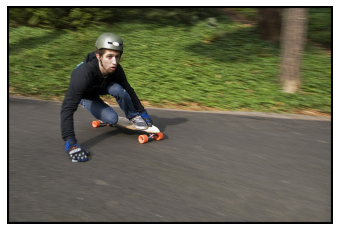

Question : Is that a normal sized skateboard?
Top Predicted answers:  [('skiing', 19.541544), ('snow', 7.850818), ('grass', 5.5911613), ('snowboarding', 4.925746), ('right', 3.4289818)]
****************************************************************************************************


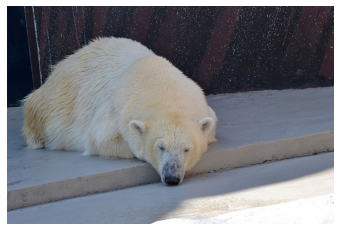

Question : What is the bear doing?
Top Predicted answers:  [('skiing', 21.569082), ('snowboarding', 14.079759), ('standing', 11.092794), ('flying kite', 8.840317), ('walking', 8.631369)]
****************************************************************************************************


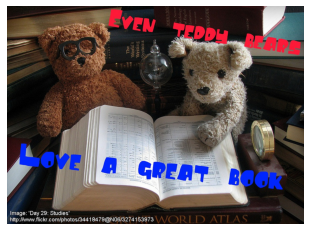

Question : Can teddy bears really read?
Top Predicted answers:  [('right', 14.689509), ('left', 7.1838183), ('yes', 5.5877013), ('both', 5.2520084), ('no', 4.0346084)]
****************************************************************************************************


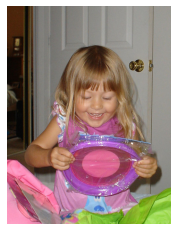

Question : Does she look happy with her item?
Top Predicted answers:  [('skiing', 10.094748), ('yes', 5.07642), ('right', 4.469773), ('snowboarding', 4.2703333), ('none', 3.3458889)]
****************************************************************************************************


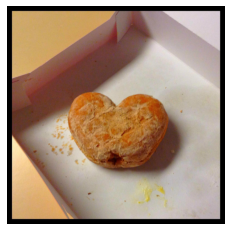

Question : How many compartments are in the container?
Top Predicted answers:  [('1', 24.743267), ('0', 14.098054), ('2', 14.039146), ('3', 11.692296), ('4', 6.938663)]
****************************************************************************************************


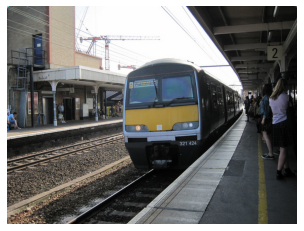

Question : Is the station empty?
Top Predicted answers:  [('right', 14.0784445), ('left', 5.5925064), ('south', 5.2122097), ('street', 3.603212), ('none', 3.0311792)]
****************************************************************************************************


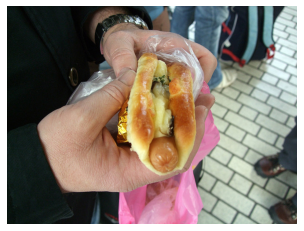

Question : Is there any cheese on the hot dog?
Top Predicted answers:  [('yes', 9.908096), ('right', 7.3249474), ('no', 7.094746), ('none', 6.4221525), ('left', 3.2756422)]
****************************************************************************************************


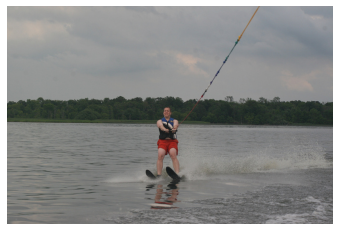

Question : Are the waters calm?
Top Predicted answers:  [('grass', 5.549155), ('right', 5.4935327), ('sand', 4.0324883), ('beach', 3.8065965), ('snow', 3.6904426)]
****************************************************************************************************


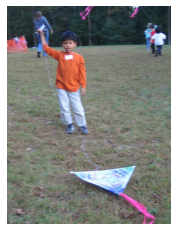

Question : What ethnicity is the boy?
Top Predicted answers:  [('white', 22.856934), ('asian', 6.882021), ('indian', 6.166877), ('yellow', 4.1978126), ('flying kite', 4.186699)]
****************************************************************************************************


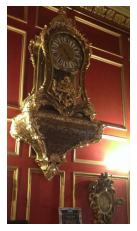

Question : What time is on the clock?
Top Predicted answers:  [('right', 11.924602), ('left', 6.7132206), ('none', 2.6423898), ('20', 2.456886), ('12', 2.3238904)]
****************************************************************************************************


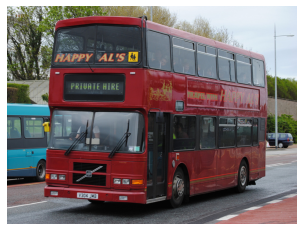

Question : How many levels does this bus have?
Top Predicted answers:  [('1', 50.806164), ('2', 25.835934), ('0', 8.387827), ('3', 6.9277263), ('4', 3.105104)]
****************************************************************************************************


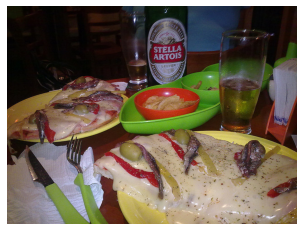

Question : Could a person with lactose intolerance eat this?
Top Predicted answers:  [('yes', 7.8104167), ('right', 6.1698427), ('no', 4.1593094), ('grass', 2.8863716), ('both', 2.461367)]
****************************************************************************************************


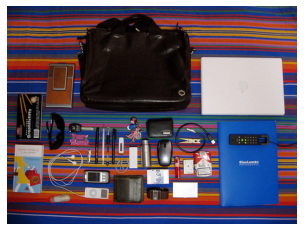

Question : What color is this travel bag?
Top Predicted answers:  [('red', 27.863756), ('green', 18.264454), ('blue', 13.365078), ('yellow', 11.549299), ('white', 6.0855193)]
****************************************************************************************************


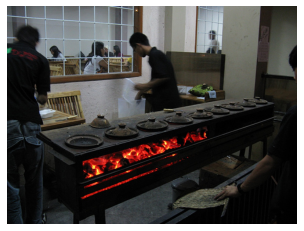

Question : Is the rack in the oven?
Top Predicted answers:  [('motorcycle', 7.1791506), ('none', 3.6653023), ('right', 3.451019), ('yes', 2.9431117), ('no', 2.9314966)]
****************************************************************************************************


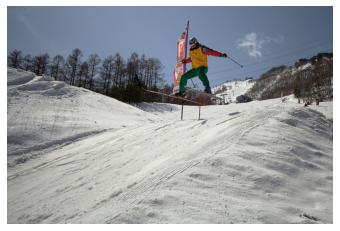

Question : What color is the jacket?
Top Predicted answers:  [('green', 18.10014), ('yellow', 13.66123), ('red', 13.416515), ('blue', 8.984901), ('white', 8.711281)]
****************************************************************************************************


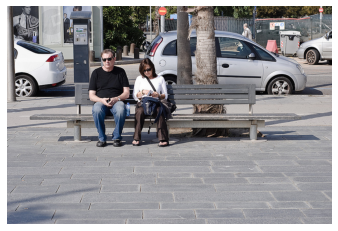

Question : Is the bench empty?
Top Predicted answers:  [('right', 7.413231), ('both', 4.7214994), ('parked', 3.1806772), ('neither', 3.1724792), ('middle', 2.7108016)]
****************************************************************************************************


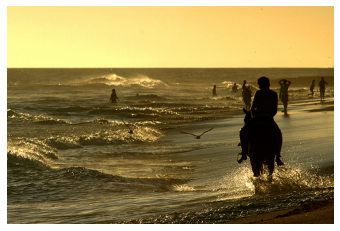

Question : Is this a winter activity?
Top Predicted answers:  [('walking', 4.340163), ('standing', 3.7966971), ('zebra', 3.6392922), ('beach', 3.5380383), ('parked', 3.2481823)]
****************************************************************************************************


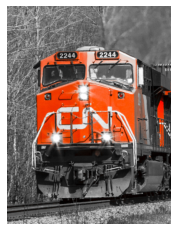

Question : Do the numbers on both sides of the train match?
Top Predicted answers:  [('parked', 6.1966558), ('standing', 4.3585515), ('right', 3.6140258), ('yes', 3.4401119), ('walking', 3.2222335)]
****************************************************************************************************


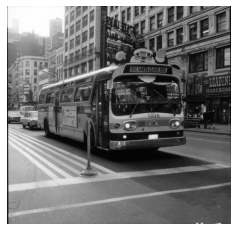

Question : Is the bus new?
Top Predicted answers:  [('parked', 6.739676), ('right', 6.4456882), ('standing', 3.7088962), ('street', 3.7045782), ('0', 3.6029537)]
****************************************************************************************************


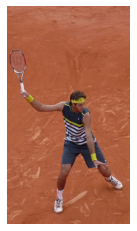

Question : What color is his headband?
Top Predicted answers:  [('white', 26.017168), ('blue', 8.499744), ('yellow', 8.208258), ('red', 6.811475), ('green', 5.5120196)]
****************************************************************************************************


In [22]:
generate_on_test(model)

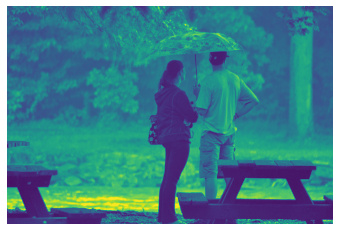

Question : what is the man holding up to his head?
Actual Answer:  umbrella
Top Predicted answers:  [('nothing', 15.370854), ('hat', 7.5550923), ('phone', 7.1710534), ('helmet', 6.6972504), ('ski poles', 4.009387)]
****************************************************************************************************


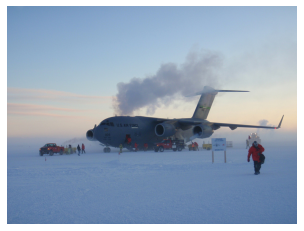

Question : is this man catching a plane?
Actual Answer:  no
Top Predicted answers:  [('no', 62.916367), ('yes', 37.0055), ('kite', 0.0021619252), ('beach', 0.0017049977), ('plane', 0.0016973678)]
****************************************************************************************************


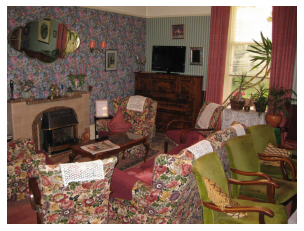

Question : what pattern is the wall?
Actual Answer:  floral
Top Predicted answers:  [('checkered', 31.628784), ('floral', 18.99874), ('solid', 13.650656), ('stripes', 8.108861), ('plaid', 7.885974)]
****************************************************************************************************


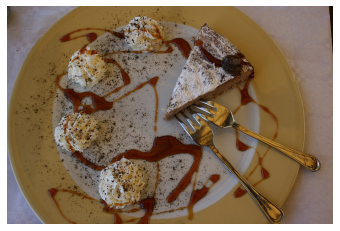

Question : what is this dish?
Actual Answer:  cheesecake
Top Predicted answers:  [('pizza', 27.270407), ('cake', 10.769219), ('sandwich', 8.4894705), ('fruit', 6.104519), ('donut', 4.3683796)]
****************************************************************************************************


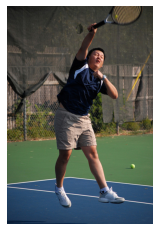

Question : is the man feet on the ground?
Actual Answer:  no
Top Predicted answers:  [('yes', 52.474358), ('no', 47.394424), ('tennis', 0.004991404), ('baseball', 0.003615287), ('tennis racket', 0.0029034303)]
****************************************************************************************************


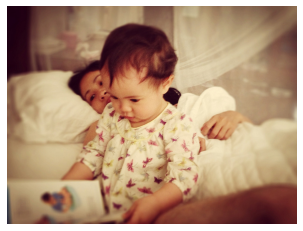

Question : is there a man and woman in the picture?
Actual Answer:  no
Top Predicted answers:  [('yes', 50.472206), ('no', 49.462482), ('man', 0.00094947027), ('none', 0.00081040664), ('2', 0.0008033917)]
****************************************************************************************************


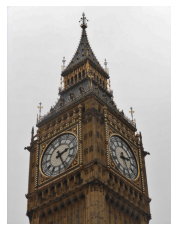

Question : are there crosses on the tower?
Actual Answer:  yes
Top Predicted answers:  [('no', 55.47822), ('yes', 44.429752), ('zebra', 0.0030077093), ('none', 0.0023897067), ('right', 0.0013235707)]
****************************************************************************************************


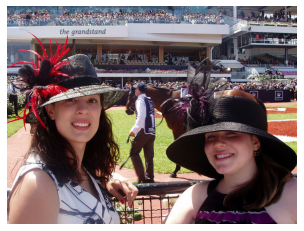

Question : what color is the horse?
Actual Answer:  brown
Top Predicted answers:  [('white', 47.61178), ('brown', 23.871262), ('black', 14.792137), ('gray', 2.364452), ('red', 1.8339204)]
****************************************************************************************************


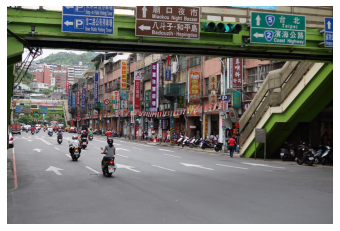

Question : are the motorcycles heeding the traffic signs?
Actual Answer:  yes
Top Predicted answers:  [('yes', 52.324795), ('no', 47.625187), ('safety', 0.0018162171), ('protection', 0.0012158123), ('stop', 0.00078810647)]
****************************************************************************************************


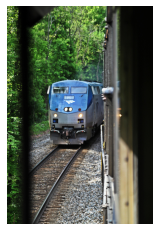

Question : what colors are the train?
Actual Answer:  blue and gray
Top Predicted answers:  [('red and white', 10.122631), ('blue', 9.230068), ('green and yellow', 7.154125), ('blue and white', 6.3741274), ('blue and yellow', 6.335816)]
****************************************************************************************************


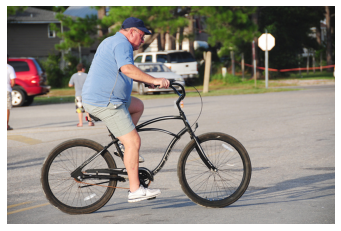

Question : are the houses brick in the scene?
Actual Answer:  no
Top Predicted answers:  [('yes', 50.221897), ('no', 49.76268), ('baseball', 0.0018431745), ('soccer', 0.000921259), ('frisbee', 0.00050475437)]
****************************************************************************************************


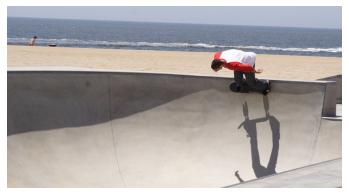

Question : is the man facing his shadow?
Actual Answer:  yes
Top Predicted answers:  [('no', 54.239388), ('yes', 45.7329), ('baseball', 0.00060561486), ('none', 0.0003755882), ('bathroom', 0.00028701522)]
****************************************************************************************************


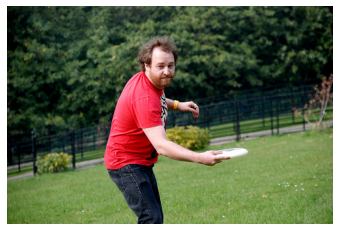

Question : what kind of shirt does the man have?
Actual Answer:  t-shirt
Top Predicted answers:  [('none', 9.300019), ('baseball', 8.853294), ('plaid', 8.128986), ('polo', 7.5660944), ('nike', 6.2803483)]
****************************************************************************************************


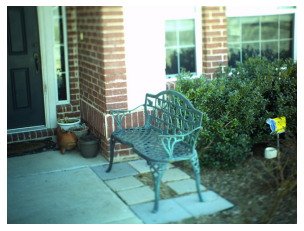

Question : what are the pots for?
Actual Answer:  plants
Top Predicted answers:  [('cooking', 13.154331), ('work', 7.98432), ('sitting', 4.0241866), ('eating', 2.9070566), ('decoration', 2.6991873)]
****************************************************************************************************


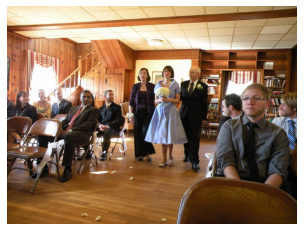

Question : which person is carrying a bouquet?
Actual Answer:  bride
Top Predicted answers:  [('boy', 26.160578), ('man', 24.364546), ('woman', 19.954094), ('girl', 11.25579), ('child', 2.2086577)]
****************************************************************************************************


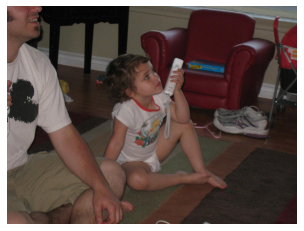

Question : what color is the little girl hair?
Actual Answer:  brown
Top Predicted answers:  [('brown', 42.797367), ('black', 16.213806), ('blonde', 15.720025), ('red', 4.402345), ('white', 3.2825773)]
****************************************************************************************************


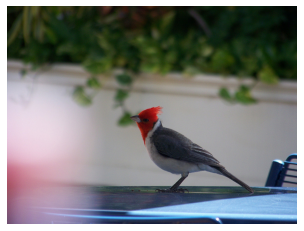

Question : what is the bird perched on?
Actual Answer:  table
Top Predicted answers:  [('branch', 20.37136), ('rock', 3.6847792), ('surfboard', 3.2396555), ('rope', 2.3044672), ('keyboard', 2.169171)]
****************************************************************************************************


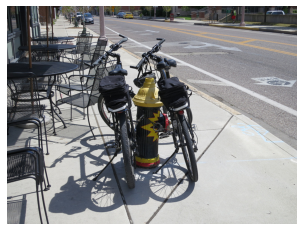

Question : is the fire hydrant painted in the conventional manner?
Actual Answer:  no
Top Predicted answers:  [('no', 65.23497), ('yes', 34.603962), ('none', 0.0076966286), ('2', 0.0025026859), ('0', 0.0024444687)]
****************************************************************************************************


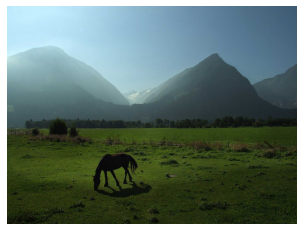

Question : is this in a park?
Actual Answer:  no
Top Predicted answers:  [('no', 59.346054), ('yes', 40.561066), ('beach', 0.0047945585), ('kite', 0.004592542), ('surfboard', 0.0021531116)]
****************************************************************************************************


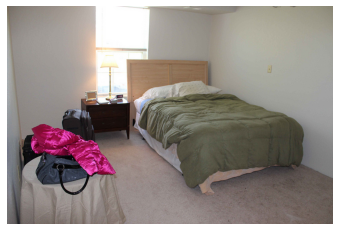

Question : are there any window coverings in the room?
Actual Answer:  no
Top Predicted answers:  [('no', 55.571644), ('yes', 44.346287), ('none', 0.002795421), ('cat', 0.0011598765), ('man', 0.0011043728)]
****************************************************************************************************


In [23]:
generate_on_val(model)

In [ ]:
print_accuracy_metrics(model)

### ResNet + Glove

In [24]:
model = create_glove_model()
model.load_weights('/home/divyaj/Plots/models/resnet/glove.hdf5')

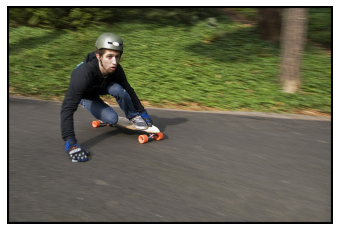

Question : Is that a normal sized skateboard?
Top Predicted answers:  [('yes', 54.029526), ('no', 45.96757), ('frisbee', 8.8672175e-05), ('wetsuit', 5.276871e-05), ('baseball', 5.1246156e-05)]
****************************************************************************************************


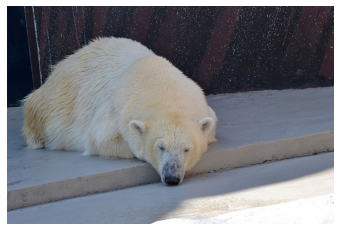

Question : What is the bear doing?
Top Predicted answers:  [('standing', 18.238129), ('walking', 13.378225), ('sitting', 6.9920063), ('surfing', 6.7210174), ('eating', 6.2741094)]
****************************************************************************************************


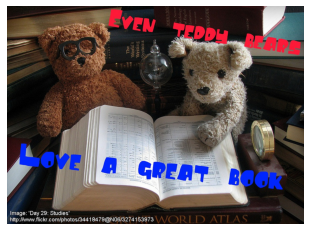

Question : Can teddy bears really read?
Top Predicted answers:  [('yes', 62.276806), ('no', 37.666096), ('phone', 0.001527746), ('sunny', 0.0015230296), ('2', 0.0012186328)]
****************************************************************************************************


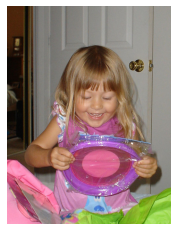

Question : Does she look happy with her item?
Top Predicted answers:  [('yes', 59.53671), ('no', 40.461895), ('man', 1.4449893e-05), ('decoration', 1.4069654e-05), ('camera', 1.3798745e-05)]
****************************************************************************************************


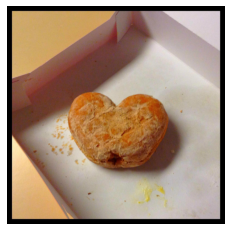

Question : How many compartments are in the container?
Top Predicted answers:  [('1', 28.916073), ('2', 24.054228), ('3', 13.772233), ('4', 9.796852), ('0', 6.3718276)]
****************************************************************************************************


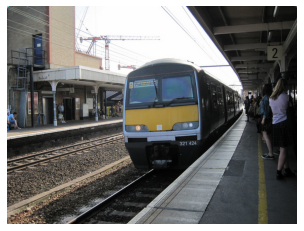

Question : Is the station empty?
Top Predicted answers:  [('no', 54.23815), ('yes', 45.729546), ('train', 0.00088380545), ('pole', 0.0006266187), ('red', 0.0004158755)]
****************************************************************************************************


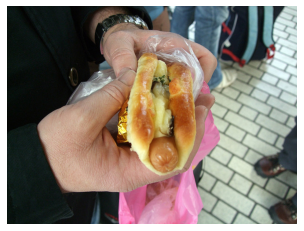

Question : Is there any cheese on the hot dog?
Top Predicted answers:  [('yes', 59.689323), ('no', 40.30886), ('2', 4.7283516e-05), ('sunny', 3.411575e-05), ('1', 3.4114906e-05)]
****************************************************************************************************


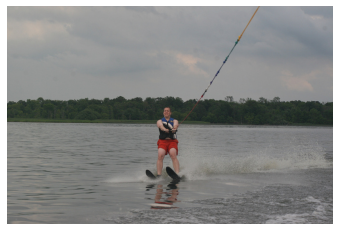

Question : Are the waters calm?
Top Predicted answers:  [('yes', 54.766846), ('no', 45.22992), ('sun', 5.8495978e-05), ('happy', 5.6209286e-05), ('sunny', 5.4086468e-05)]
****************************************************************************************************


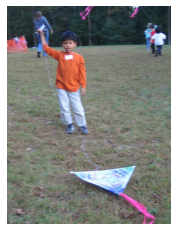

Question : What ethnicity is the boy?
Top Predicted answers:  [('white', 78.06791), ('asian', 12.810818), ('indian', 1.31888), ('black', 1.2199193), ('american', 0.9965768)]
****************************************************************************************************


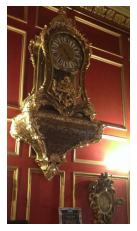

Question : What time is on the clock?
Top Predicted answers:  [('noon', 14.990242), ('night', 13.840793), ('evening', 11.476659), ('dusk', 8.7476425), ('afternoon', 8.2275305)]
****************************************************************************************************


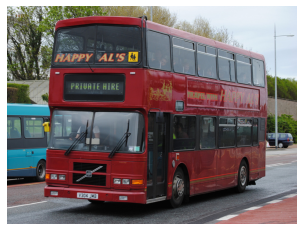

Question : How many levels does this bus have?
Top Predicted answers:  [('1', 27.625244), ('2', 21.985752), ('3', 12.082637), ('4', 7.3918304), ('0', 6.580289)]
****************************************************************************************************


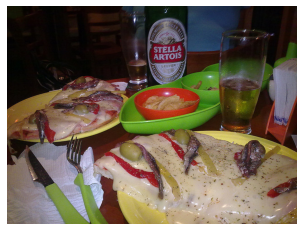

Question : Could a person with lactose intolerance eat this?
Top Predicted answers:  [('yes', 57.530975), ('no', 42.46828), ('pizza', 1.5242747e-05), ('neither', 1.3648652e-05), ('cake', 1.2848565e-05)]
****************************************************************************************************


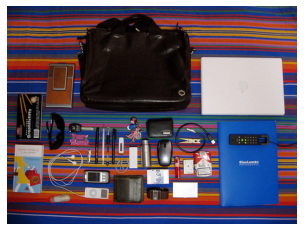

Question : What color is this travel bag?
Top Predicted answers:  [('blue', 22.75358), ('red', 21.245409), ('yellow', 11.5921135), ('black', 8.002854), ('pink', 5.879799)]
****************************************************************************************************


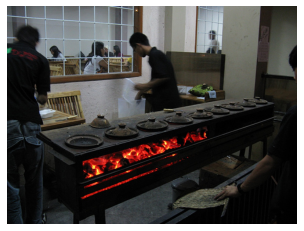

Question : Is the rack in the oven?
Top Predicted answers:  [('no', 55.18374), ('yes', 44.813095), ('wood', 7.28212e-05), ('white', 5.7701647e-05), ('red', 5.4673616e-05)]
****************************************************************************************************


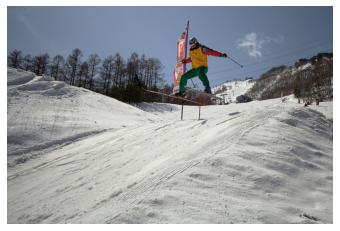

Question : What color is the jacket?
Top Predicted answers:  [('white', 23.242504), ('blue', 19.054873), ('black', 9.872775), ('gray', 8.287599), ('red', 7.3299556)]
****************************************************************************************************


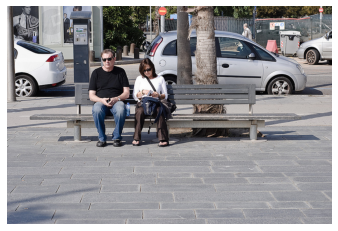

Question : Is the bench empty?
Top Predicted answers:  [('no', 54.37687), ('yes', 45.616444), ('2', 0.000102507656), ('nowhere', 9.613518e-05), ('background', 9.301219e-05)]
****************************************************************************************************


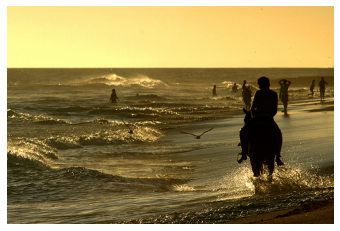

Question : Is this a winter activity?
Top Predicted answers:  [('yes', 52.98389), ('no', 47.014153), ('christmas', 4.017584e-05), ('soccer', 3.8037033e-05), ('safety', 2.6641486e-05)]
****************************************************************************************************


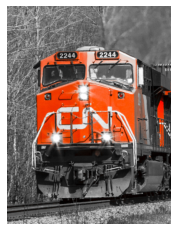

Question : Do the numbers on both sides of the train match?
Top Predicted answers:  [('yes', 68.46475), ('no', 31.53013), ('2', 0.00036265817), ('1', 0.00020757737), ('3', 0.00020203264)]
****************************************************************************************************


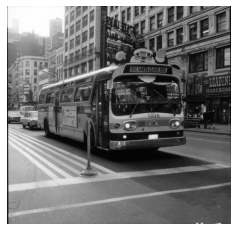

Question : Is the bus new?
Top Predicted answers:  [('no', 58.039886), ('yes', 41.952496), ('2', 0.00015718259), ('1', 0.00015410564), ('safety', 0.00013118637)]
****************************************************************************************************


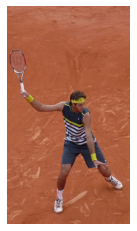

Question : What color is his headband?
Top Predicted answers:  [('white', 24.126213), ('blue', 14.795884), ('red', 14.596547), ('yellow', 10.456373), ('black', 10.388188)]
****************************************************************************************************


In [25]:
generate_on_test(model)

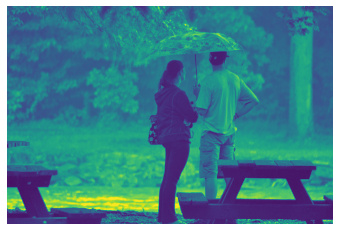

Question : what is the man holding up to his head?
Actual Answer:  umbrella
Top Predicted answers:  [('hat', 12.030411), ('helmet', 11.099805), ('nothing', 10.654761), ('phone', 5.5146356), ('umbrella', 3.6975522)]
****************************************************************************************************


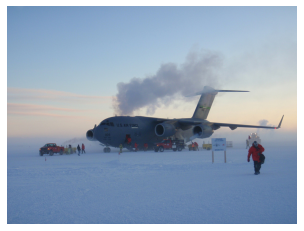

Question : is this man catching a plane?
Actual Answer:  no
Top Predicted answers:  [('no', 57.86416), ('yes', 42.09033), ('beach', 0.0009456121), ('neither', 0.0009014769), ('kite', 0.00080066075)]
****************************************************************************************************


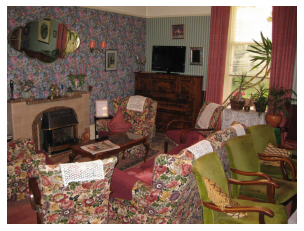

Question : what pattern is the wall?
Actual Answer:  floral
Top Predicted answers:  [('checkered', 37.028633), ('floral', 22.883266), ('stripes', 10.032283), ('solid', 8.857431), ('plaid', 6.958334)]
****************************************************************************************************


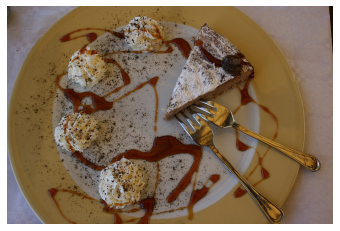

Question : what is this dish?
Actual Answer:  cheesecake
Top Predicted answers:  [('pizza', 28.675041), ('sandwich', 13.140115), ('cake', 10.125165), ('soup', 4.1139374), ('salad', 4.0456204)]
****************************************************************************************************


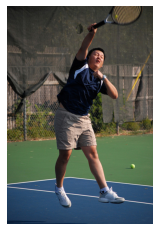

Question : is the man feet on the ground?
Actual Answer:  no
Top Predicted answers:  [('no', 50.26667), ('yes', 49.53963), ('tennis', 0.015839245), ('tennis court', 0.00391429), ('tennis racket', 0.0032613392)]
****************************************************************************************************


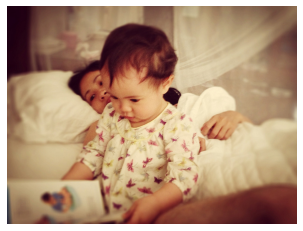

Question : is there a man and woman in the picture?
Actual Answer:  no
Top Predicted answers:  [('yes', 51.166702), ('no', 48.76781), ('pizza', 0.0010484101), ('2', 0.0009128641), ('real', 0.00072620413)]
****************************************************************************************************


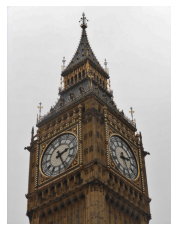

Question : are there crosses on the tower?
Actual Answer:  yes
Top Predicted answers:  [('no', 56.464123), ('yes', 43.489437), ('nothing', 0.0017413639), ('neither', 0.0011711654), ('2', 0.00086773135)]
****************************************************************************************************


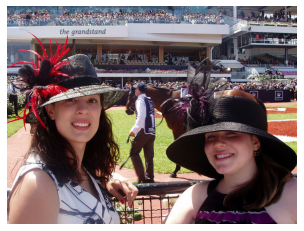

Question : what color is the horse?
Actual Answer:  brown
Top Predicted answers:  [('white', 40.304634), ('brown', 27.408546), ('black', 13.330004), ('gray', 4.0273724), ('red', 3.0925968)]
****************************************************************************************************


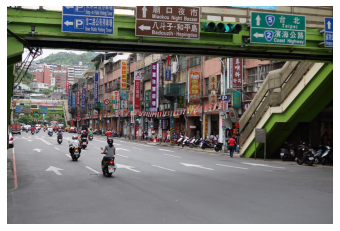

Question : are the motorcycles heeding the traffic signs?
Actual Answer:  yes
Top Predicted answers:  [('no', 56.13876), ('yes', 43.843918), ('stop', 0.0008561815), ('safety', 0.00046321715), ('protection', 0.00028956225)]
****************************************************************************************************


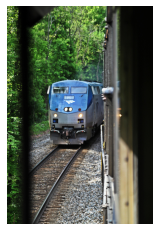

Question : what colors are the train?
Actual Answer:  blue and gray
Top Predicted answers:  [('white', 11.631118), ('blue', 8.891307), ('red and white', 8.065169), ('red', 6.1453896), ('blue and white', 5.9073434)]
****************************************************************************************************


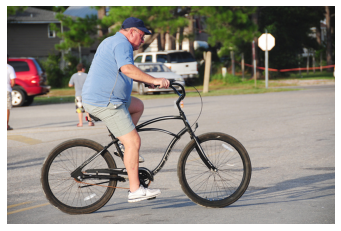

Question : are the houses brick in the scene?
Actual Answer:  no
Top Predicted answers:  [('yes', 58.323433), ('no', 41.66375), ('baseball', 0.0010190151), ('soccer', 0.0005020269), ('frisbee', 0.00042664527)]
****************************************************************************************************


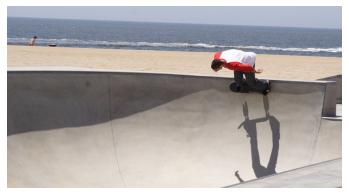

Question : is the man facing his shadow?
Actual Answer:  yes
Top Predicted answers:  [('no', 55.88398), ('yes', 44.10234), ('neither', 0.00018847517), ('ball', 0.00018826929), ('nothing', 0.00018312066)]
****************************************************************************************************


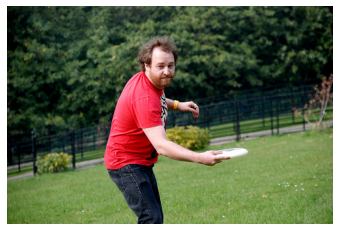

Question : what kind of shirt does the man have?
Actual Answer:  t-shirt
Top Predicted answers:  [('polo', 10.421854), ('baseball', 8.967841), ('plaid', 8.680722), ('none', 7.8428164), ('striped', 5.60773)]
****************************************************************************************************


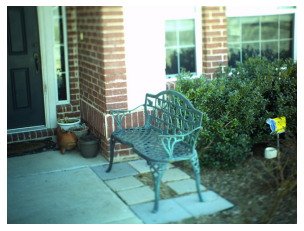

Question : what are the pots for?
Actual Answer:  plants
Top Predicted answers:  [('water', 14.943465), ('wine', 7.886967), ('food', 5.766856), ('parking', 4.723616), ('cooking', 3.44925)]
****************************************************************************************************


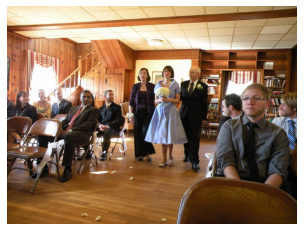

Question : which person is carrying a bouquet?
Actual Answer:  bride
Top Predicted answers:  [('man', 40.832653), ('woman', 34.25562), ('boy', 5.293164), ('girl', 4.166873), ('no one', 1.4175822)]
****************************************************************************************************


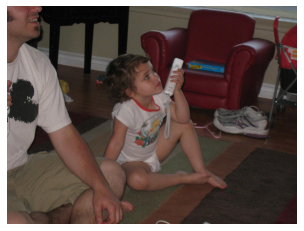

Question : what color is the little girl hair?
Actual Answer:  brown
Top Predicted answers:  [('brown', 45.61195), ('blonde', 27.423433), ('black', 8.698371), ('white', 3.3845596), ('green', 3.0502446)]
****************************************************************************************************


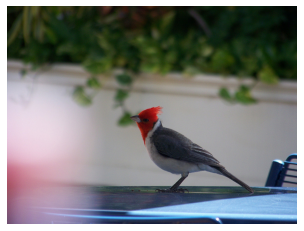

Question : what is the bird perched on?
Actual Answer:  table
Top Predicted answers:  [('branch', 37.066795), ('rock', 6.358556), ('ground', 4.815737), ('grass', 4.3604064), ('table', 3.8955014)]
****************************************************************************************************


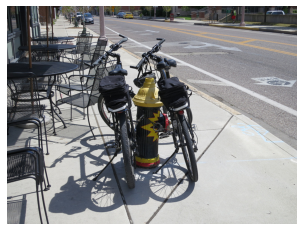

Question : is the fire hydrant painted in the conventional manner?
Actual Answer:  no
Top Predicted answers:  [('no', 63.313354), ('yes', 36.644527), ('none', 0.0028274786), ('neither', 0.0006019573), ('wood', 0.00055015006)]
****************************************************************************************************


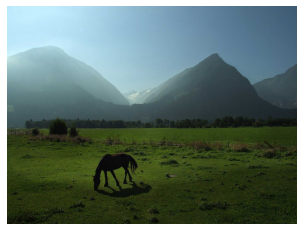

Question : is this in a park?
Actual Answer:  no
Top Predicted answers:  [('no', 61.409378), ('yes', 38.525883), ('none', 0.0019013144), ('beach', 0.0017707045), ('kite', 0.001292734)]
****************************************************************************************************


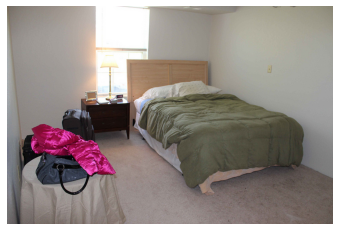

Question : are there any window coverings in the room?
Actual Answer:  no
Top Predicted answers:  [('no', 51.560093), ('yes', 48.40653), ('none', 0.0007576027), ('white', 0.0007324207), ('wood', 0.0006118192)]
****************************************************************************************************


In [26]:
generate_on_val(model)

In [ ]:
print_accuracy_metrics(model)

### ResNet + BERT

In [ ]:
model = create_bert_model()
model.load_weights('/home/divyaj/Plots/models/resnet/bert.hdf5')

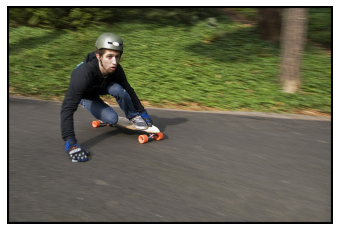

Question : Is that a normal sized skateboard?
Top Predicted answers:  [('yes', 55.786102), ('no', 44.194332), ('3', 0.003534737), ('4', 0.0033151293), ('2', 0.0018137505)]
****************************************************************************************************


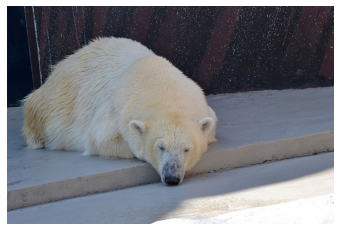

Question : What is the bear doing?
Top Predicted answers:  [('no', 54.305744), ('yes', 45.530285), ('2', 0.02897712), ('3', 0.025318842), ('1', 0.024021734)]
****************************************************************************************************


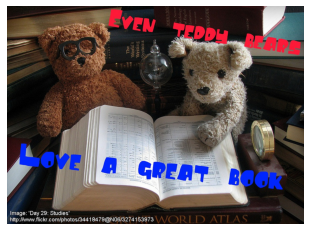

Question : Can teddy bears really read?
Top Predicted answers:  [('yes', 58.856857), ('no', 41.104424), ('shade', 0.0073653487), ('4', 0.0035753136), ('spoon', 0.0034418819)]
****************************************************************************************************


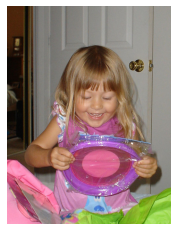

Question : Does she look happy with her item?
Top Predicted answers:  [('yes', 58.476913), ('no', 41.496624), ('4', 0.0035794284), ('3', 0.0032879368), ('fire', 0.0026653174)]
****************************************************************************************************


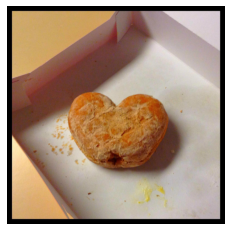

Question : How many compartments are in the container?
Top Predicted answers:  [('yes', 59.490894), ('no', 40.47997), ('fire', 0.005812326), ('3', 0.0040477244), ('4', 0.003740582)]
****************************************************************************************************


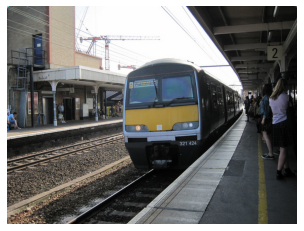

Question : Is the station empty?
Top Predicted answers:  [('yes', 57.597996), ('no', 42.3767), ('fire', 0.0035733264), ('4', 0.0033390075), ('3', 0.0028260008)]
****************************************************************************************************


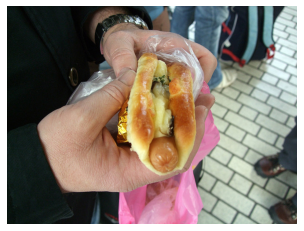

Question : Is there any cheese on the hot dog?
Top Predicted answers:  [('yes', 57.425053), ('no', 42.549953), ('4', 0.00354073), ('3', 0.0033962461), ('fire', 0.0023716632)]
****************************************************************************************************


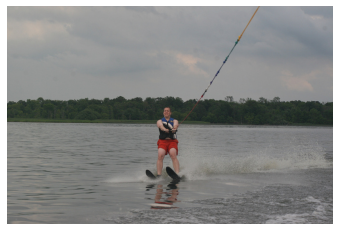

Question : Are the waters calm?
Top Predicted answers:  [('yes', 55.381264), ('no', 44.564606), ('fire', 0.011006895), ('3', 0.0055738855), ('shade', 0.004976179)]
****************************************************************************************************


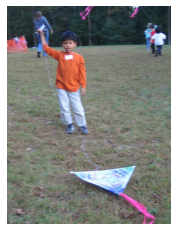

Question : What ethnicity is the boy?
Top Predicted answers:  [('yes', 56.937374), ('no', 43.03309), ('fire', 0.0037357677), ('4', 0.0030160754), ('shade', 0.0028836736)]
****************************************************************************************************


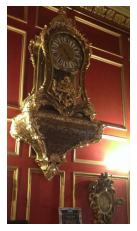

Question : What time is on the clock?
Top Predicted answers:  [('yes', 56.72296), ('no', 43.242775), ('4', 0.0045051556), ('fire', 0.0041293716), ('3', 0.0036620507)]
****************************************************************************************************


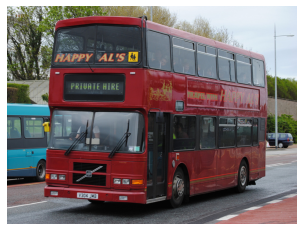

Question : How many levels does this bus have?
Top Predicted answers:  [('yes', 58.69875), ('no', 41.274746), ('4', 0.0032521773), ('3', 0.00314682), ('fire', 0.0031131585)]
****************************************************************************************************


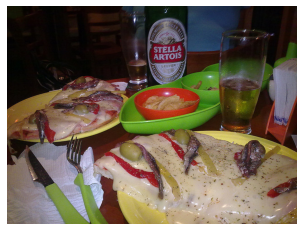

Question : Could a person with lactose intolerance eat this?
Top Predicted answers:  [('yes', 58.649616), ('no', 41.24465), ('3', 0.013374297), ('0', 0.012824114), ('10', 0.011652105)]
****************************************************************************************************


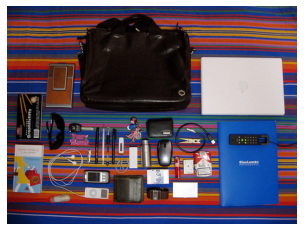

Question : What color is this travel bag?
Top Predicted answers:  [('yes', 54.054558), ('no', 45.902027), ('shade', 0.006722567), ('4', 0.0051050205), ('fire', 0.004704136)]
****************************************************************************************************


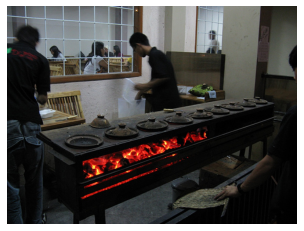

Question : Is the rack in the oven?
Top Predicted answers:  [('yes', 57.663883), ('no', 42.30651), ('fire', 0.003988014), ('4', 0.0038101466), ('3', 0.0035599754)]
****************************************************************************************************


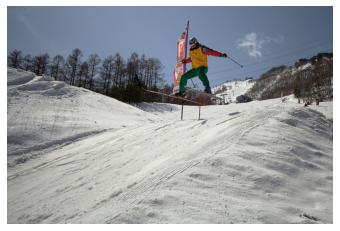

Question : What color is the jacket?
Top Predicted answers:  [('yes', 56.900047), ('no', 43.06696), ('fire', 0.00507392), ('4', 0.003688642), ('shade', 0.0031042942)]
****************************************************************************************************


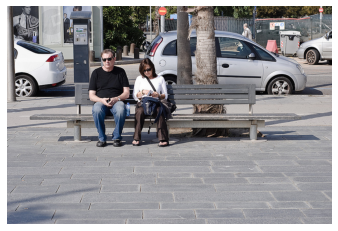

Question : Is the bench empty?
Top Predicted answers:  [('yes', 57.815422), ('no', 42.159805), ('4', 0.003346023), ('fire', 0.0031806834), ('3', 0.0028138768)]
****************************************************************************************************


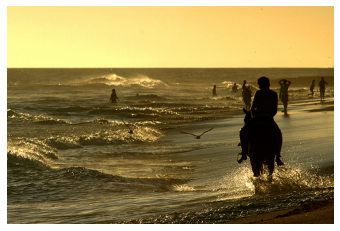

Question : Is this a winter activity?
Top Predicted answers:  [('yes', 56.624775), ('no', 43.351368), ('4', 0.003001239), ('fire', 0.0029348598), ('3', 0.0027036497)]
****************************************************************************************************


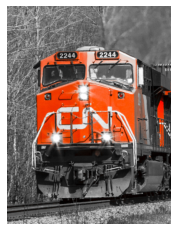

Question : Do the numbers on both sides of the train match?
Top Predicted answers:  [('yes', 58.655655), ('no', 41.315426), ('fire', 0.004191395), ('4', 0.0038124558), ('3', 0.0037440397)]
****************************************************************************************************


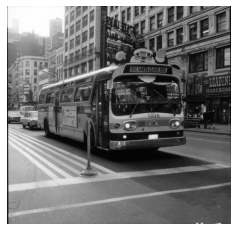

Question : Is the bus new?
Top Predicted answers:  [('yes', 57.38402), ('no', 42.589924), ('4', 0.003487151), ('fire', 0.0032832096), ('3', 0.0029339257)]
****************************************************************************************************


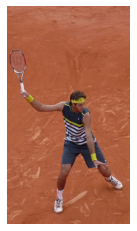

Question : What color is his headband?
Top Predicted answers:  [('yes', 56.528313), ('no', 43.43722), ('4', 0.0044678734), ('3', 0.004443572), ('0', 0.0026312734)]
****************************************************************************************************


In [28]:
generate_on_test(model)

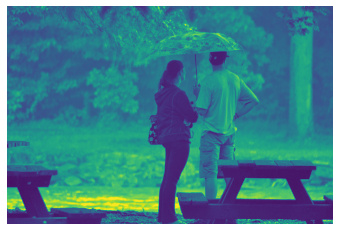

Question : what is the man holding up to his head?
Actual Answer:  umbrella
Top Predicted answers:  [('yes', 59.00788), ('no', 40.963375), ('4', 0.003552088), ('3', 0.0035426798), ('fire', 0.003090151)]
****************************************************************************************************


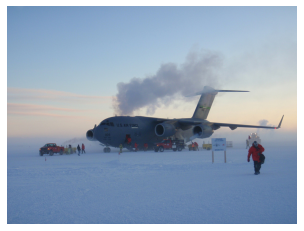

Question : is this man catching a plane?
Actual Answer:  no
Top Predicted answers:  [('yes', 58.861015), ('no', 41.106743), ('4', 0.0039615897), ('3', 0.0039501586), ('fire', 0.00342832)]
****************************************************************************************************


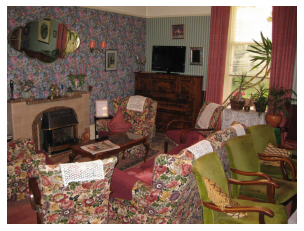

Question : what pattern is the wall?
Actual Answer:  floral
Top Predicted answers:  [('yes', 58.94626), ('no', 41.02084), ('4', 0.0041909437), ('3', 0.004038024), ('fire', 0.0038473925)]
****************************************************************************************************


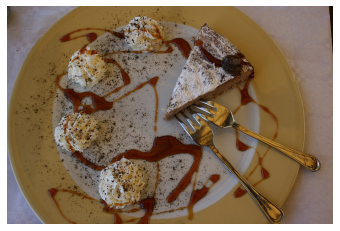

Question : what is this dish?
Actual Answer:  cheesecake
Top Predicted answers:  [('yes', 58.51782), ('no', 41.452553), ('fire', 0.004306073), ('shade', 0.0040988717), ('4', 0.0031965338)]
****************************************************************************************************


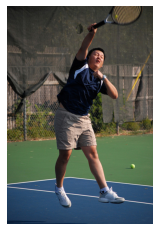

Question : is the man feet on the ground?
Actual Answer:  no
Top Predicted answers:  [('yes', 59.513145), ('no', 40.450417), ('fire', 0.0045423247), ('4', 0.004304665), ('shade', 0.004267823)]
****************************************************************************************************


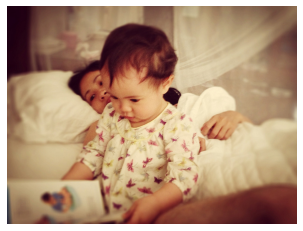

Question : is there a man and woman in the picture?
Actual Answer:  no
Top Predicted answers:  [('yes', 58.80144), ('no', 41.15682), ('4', 0.005430506), ('3', 0.005420866), ('shade', 0.0041441433)]
****************************************************************************************************


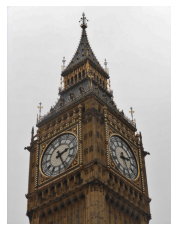

Question : are there crosses on the tower?
Actual Answer:  yes
Top Predicted answers:  [('yes', 60.12715), ('no', 39.84173), ('shade', 0.006733561), ('spoon', 0.0043841368), ('3', 0.0030482463)]
****************************************************************************************************


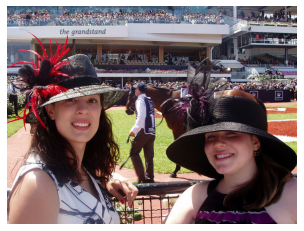

Question : what color is the horse?
Actual Answer:  brown
Top Predicted answers:  [('yes', 58.54971), ('no', 41.42006), ('fire', 0.0041937465), ('4', 0.0034518144), ('3', 0.0034267686)]
****************************************************************************************************


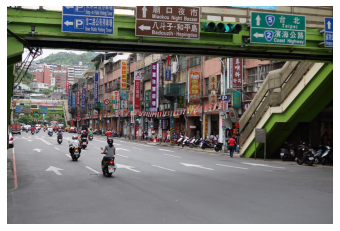

Question : are the motorcycles heeding the traffic signs?
Actual Answer:  yes
Top Predicted answers:  [('yes', 59.03827), ('no', 40.93088), ('3', 0.004296534), ('4', 0.0041450397), ('shade', 0.0028363091)]
****************************************************************************************************


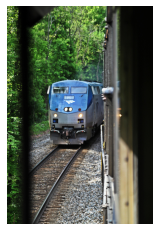

Question : what colors are the train?
Actual Answer:  blue and gray
Top Predicted answers:  [('yes', 58.783997), ('no', 41.186478), ('4', 0.0038775885), ('3', 0.0037254645), ('fire', 0.0033487112)]
****************************************************************************************************


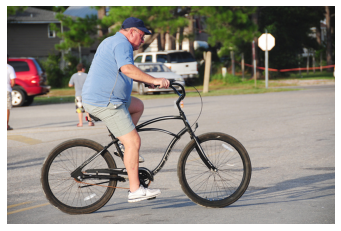

Question : are the houses brick in the scene?
Actual Answer:  no
Top Predicted answers:  [('yes', 59.19608), ('no', 40.439598), ('fire', 0.08319167), ('4', 0.05024732), ('3', 0.036131933)]
****************************************************************************************************


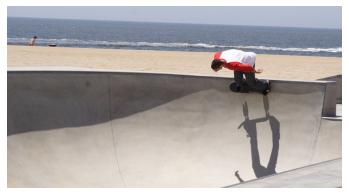

Question : is the man facing his shadow?
Actual Answer:  yes
Top Predicted answers:  [('yes', 59.18737), ('no', 40.776707), ('shade', 0.0049698222), ('fire', 0.0042962916), ('4', 0.0041213143)]
****************************************************************************************************


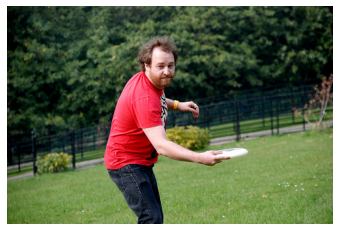

Question : what kind of shirt does the man have?
Actual Answer:  t-shirt
Top Predicted answers:  [('yes', 58.25616), ('no', 41.7106), ('3', 0.004352221), ('4', 0.0042838636), ('shade', 0.0030769738)]
****************************************************************************************************


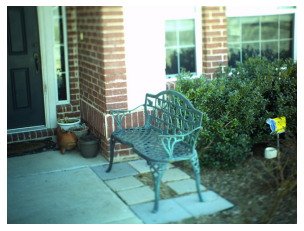

Question : what are the pots for?
Actual Answer:  plants
Top Predicted answers:  [('yes', 58.737755), ('no', 41.233517), ('fire', 0.004267231), ('4', 0.0036889608), ('3', 0.0029278197)]
****************************************************************************************************


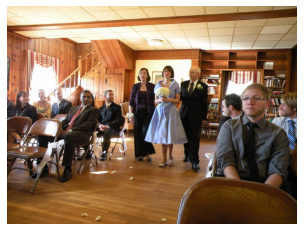

Question : which person is carrying a bouquet?
Actual Answer:  bride
Top Predicted answers:  [('yes', 59.540646), ('no', 40.438377), ('4', 0.003101458), ('3', 0.002820209), ('0', 0.0014482235)]
****************************************************************************************************


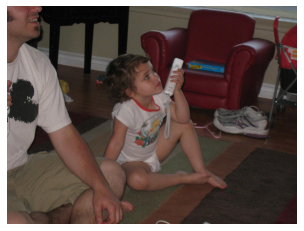

Question : what color is the little girl hair?
Actual Answer:  brown
Top Predicted answers:  [('yes', 58.464592), ('no', 41.511173), ('fire', 0.0029891445), ('3', 0.0028063469), ('4', 0.002777996)]
****************************************************************************************************


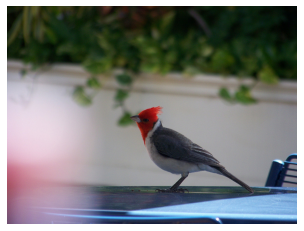

Question : what is the bird perched on?
Actual Answer:  table
Top Predicted answers:  [('yes', 58.255367), ('no', 41.712822), ('shade', 0.0066380394), ('fire', 0.0033536453), ('4', 0.0033279785)]
****************************************************************************************************


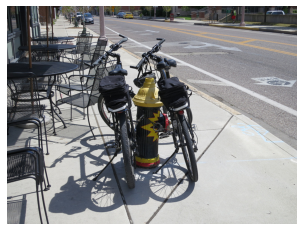

Question : is the fire hydrant painted in the conventional manner?
Actual Answer:  no
Top Predicted answers:  [('yes', 57.86764), ('no', 41.94464), ('4', 0.03712758), ('3', 0.02618536), ('spoon', 0.02267834)]
****************************************************************************************************


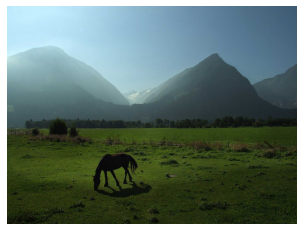

Question : is this in a park?
Actual Answer:  no
Top Predicted answers:  [('yes', 58.688267), ('no', 41.28119), ('fire', 0.004027515), ('shade', 0.0037665654), ('4', 0.003402192)]
****************************************************************************************************


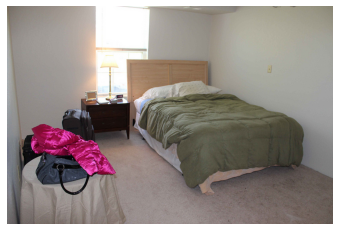

Question : are there any window coverings in the room?
Actual Answer:  no
Top Predicted answers:  [('yes', 59.37689), ('no', 40.586235), ('4', 0.0048791906), ('3', 0.0045996984), ('spoon', 0.003920446)]
****************************************************************************************************


In [29]:
generate_on_val(model)

In [ ]:
print_accuracy_metrics(model)